In [1]:
# 1. IMPORT LIBRARIES
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Download nltk data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [3]:
# 2. LOAD DATA
# --------------------------------------------------------------
df = pd.read_csv("/Tweets.csv")

# Drop unnecessary columns
df = df.drop(columns=['user_timezone','tweet_location','tweet_created','tweet_coord','negativereason_gold','tweet_id'], errors='ignore')

# Quick check
print(df.head())
print(df['airline'].value_counts())  # Check airlines

  airline_sentiment  airline_sentiment_confidence negativereason  \
0           neutral                        1.0000            NaN   
1          positive                        0.3486            NaN   
2           neutral                        0.6837            NaN   
3          negative                        1.0000     Bad Flight   
4          negative                        1.0000     Can't Tell   

   negativereason_confidence         airline airline_sentiment_gold  \
0                        NaN  Virgin America                    NaN   
1                     0.0000  Virgin America                    NaN   
2                        NaN  Virgin America                    NaN   
3                     0.7033  Virgin America                    NaN   
4                     1.0000  Virgin America                    NaN   

         name  retweet_count  \
0     cairdin              0   
1    jnardino              0   
2  yvonnalynn              0   
3    jnardino              0   
4   

In [6]:
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"http\S+|www\S+", "", text)  # remove URLs
    text = re.sub(r"@[A-Za-z0-9_]+", "", text)  # remove mentions
    text = re.sub(r"#", "", text)               # remove hashtag symbol
    text = re.sub(r"[^\w\s]", "", text)        # remove punctuation
    return text

df['clean_text'] = df['text'].apply(clean_text)

In [7]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()


In [9]:
import nltk

# Download required NLTK resources
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [11]:
import nltk
nltk.download('punkt_tab')

def preprocess_tokens(text):
    tokens = nltk.word_tokenize(text)
    tokens = [t for t in tokens if t not in stop_words]
    tokens = [lemmatizer.lemmatize(t) for t in tokens]
    return ' '.join(tokens)

df['processed_text'] = df['clean_text'].apply(preprocess_tokens)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [12]:
def preprocess_tokens(text):
    tokens = nltk.word_tokenize(text)
    tokens = [t for t in tokens if t not in stop_words]
    tokens = [lemmatizer.lemmatize(t) for t in tokens]
    return ' '.join(tokens)

df['processed_text'] = df['clean_text'].apply(preprocess_tokens)

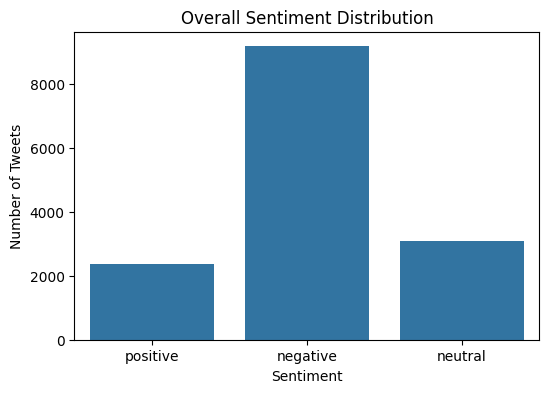

In [13]:
# 5a. Overall sentiment distribution
plt.figure(figsize=(6,4))
sns.countplot(x='airline_sentiment', data=df, order=["positive","negative","neutral"])
plt.title("Overall Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Number of Tweets")
plt.show()

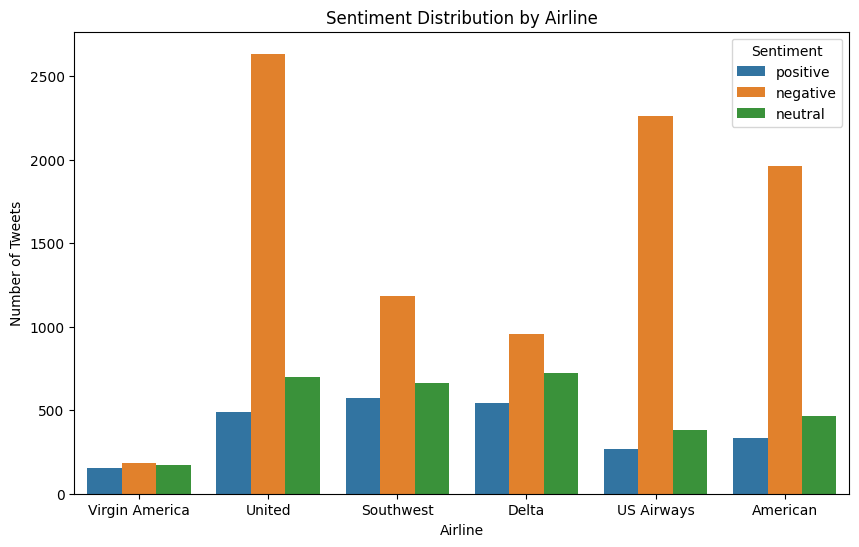

In [14]:
# 5b. Sentiment distribution by airline
plt.figure(figsize=(10,6))
sns.countplot(x='airline', hue='airline_sentiment', data=df,
              hue_order=["positive","negative","neutral"])
plt.title("Sentiment Distribution by Airline")
plt.xlabel("Airline")
plt.ylabel("Number of Tweets")
plt.legend(title='Sentiment')
plt.show()

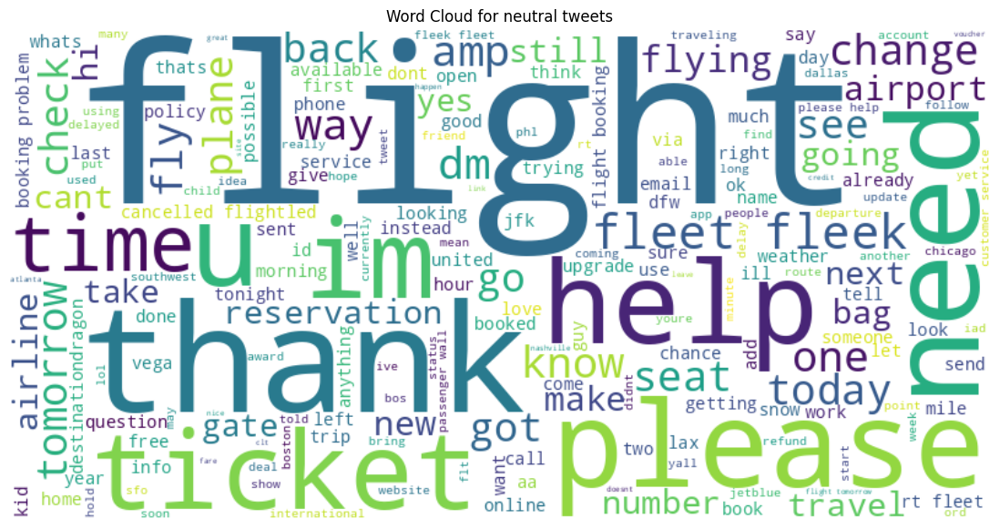

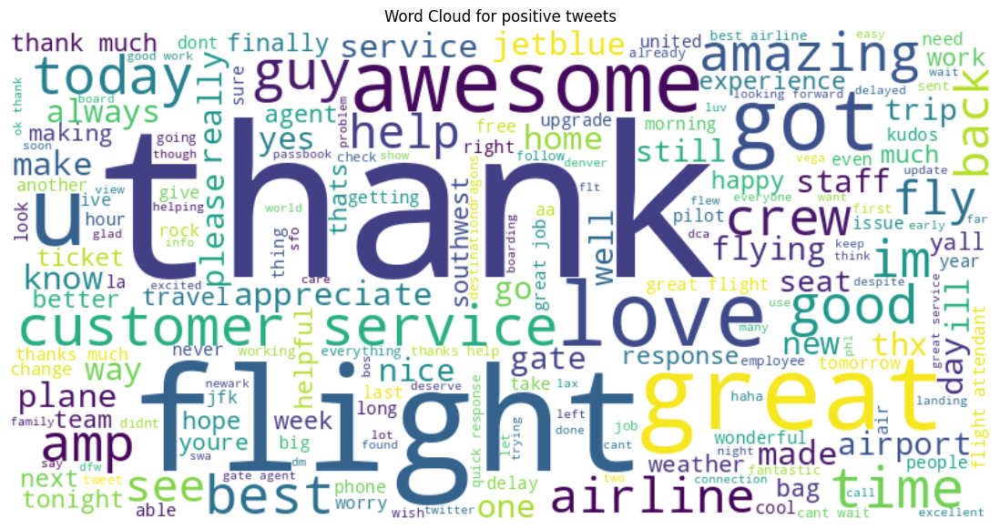

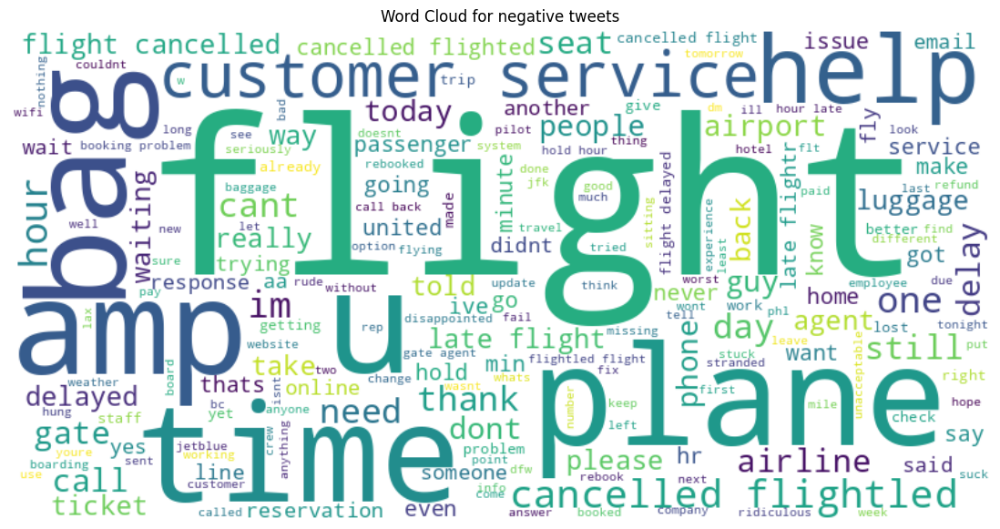

In [15]:
# 5c. Word clouds by sentiment
for sentiment in df['airline_sentiment'].unique():
    text = " ".join(df[df['airline_sentiment']==sentiment]['processed_text'])
    if text.strip() != "":
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        plt.figure(figsize=(15,7))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Word Cloud for {sentiment} tweets")
        plt.show()

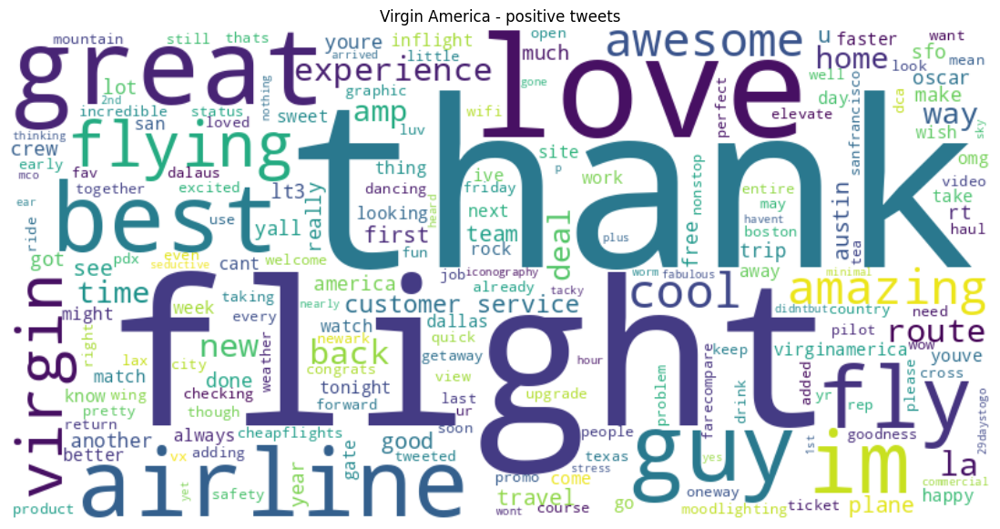

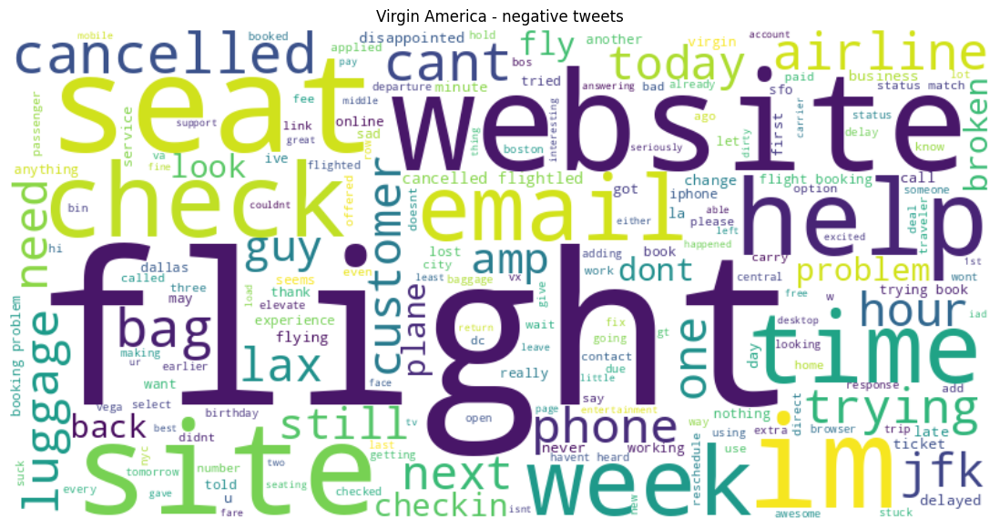

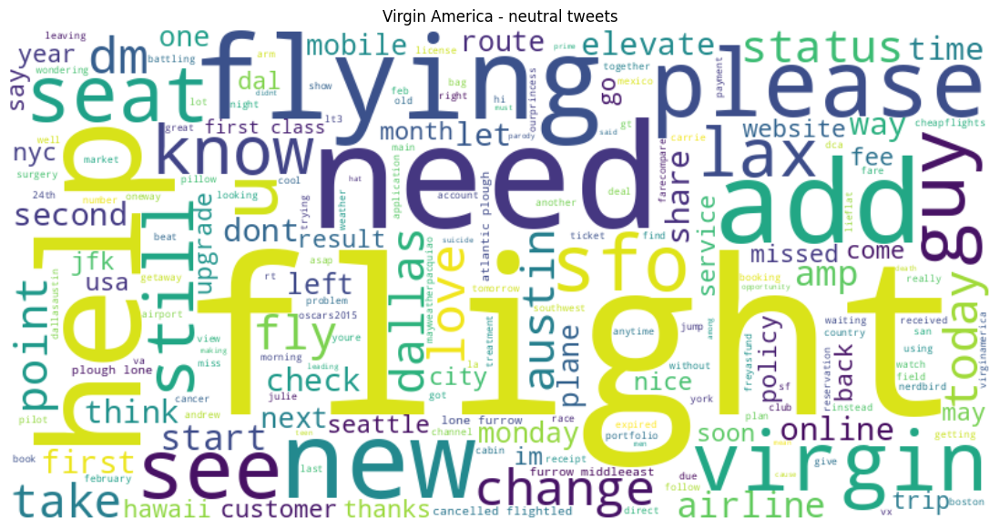

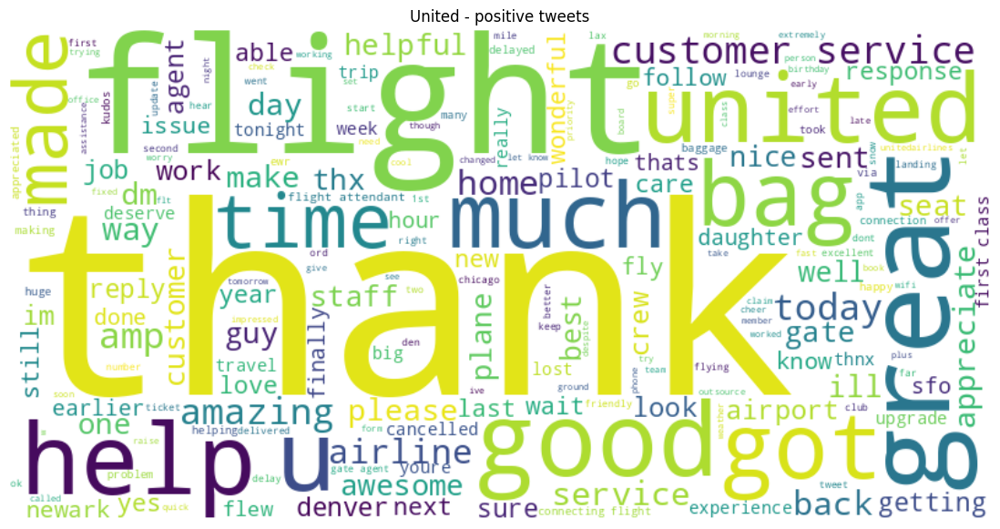

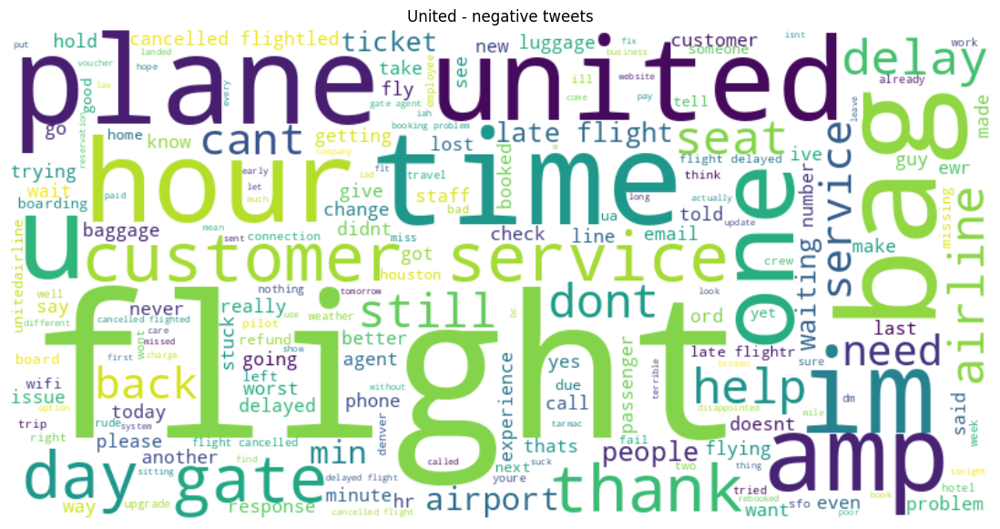

...

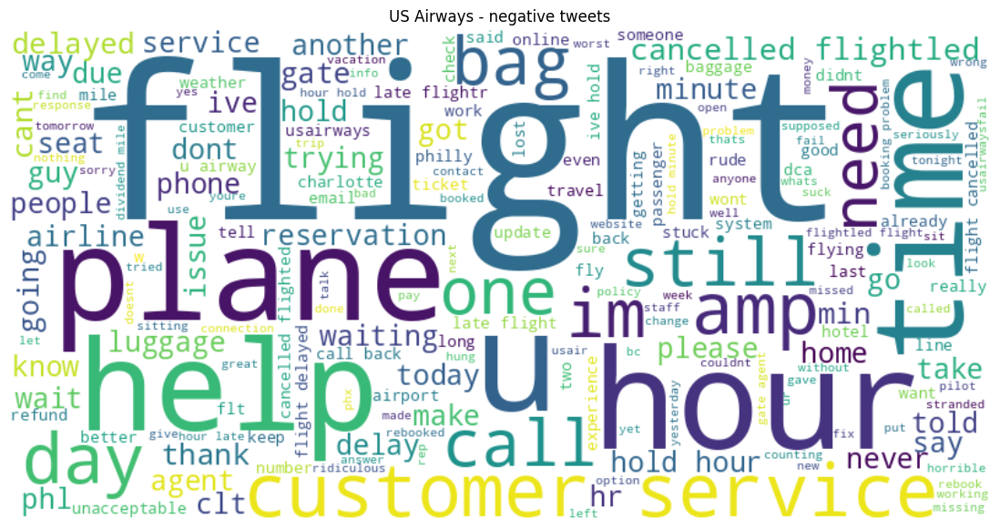

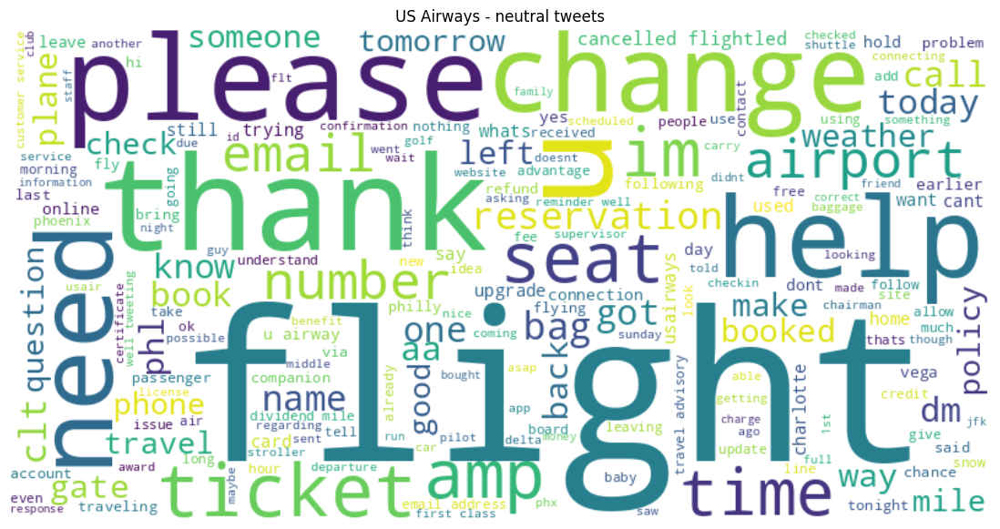

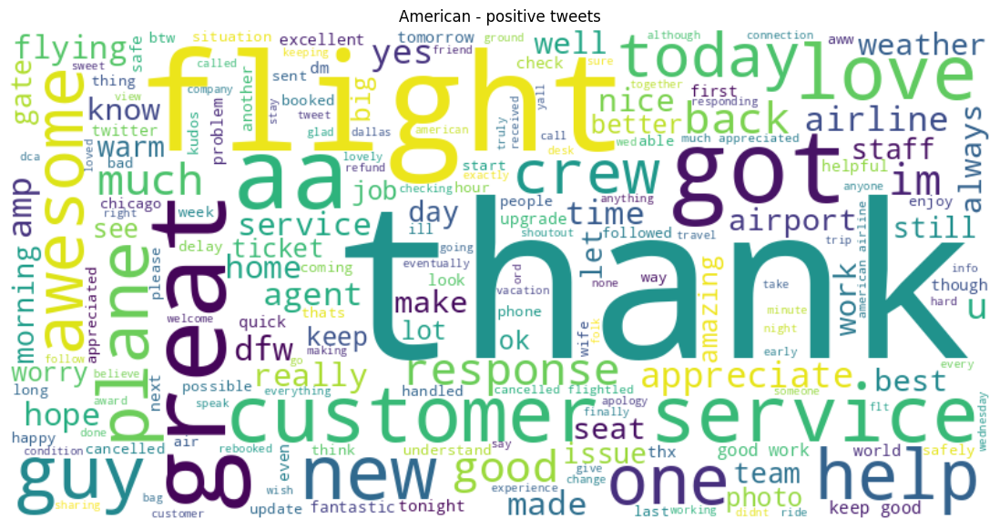

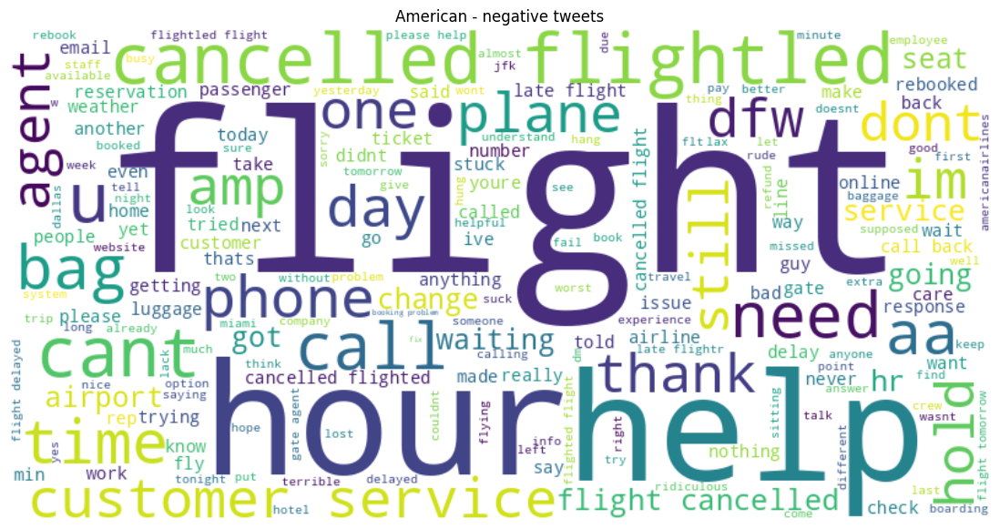

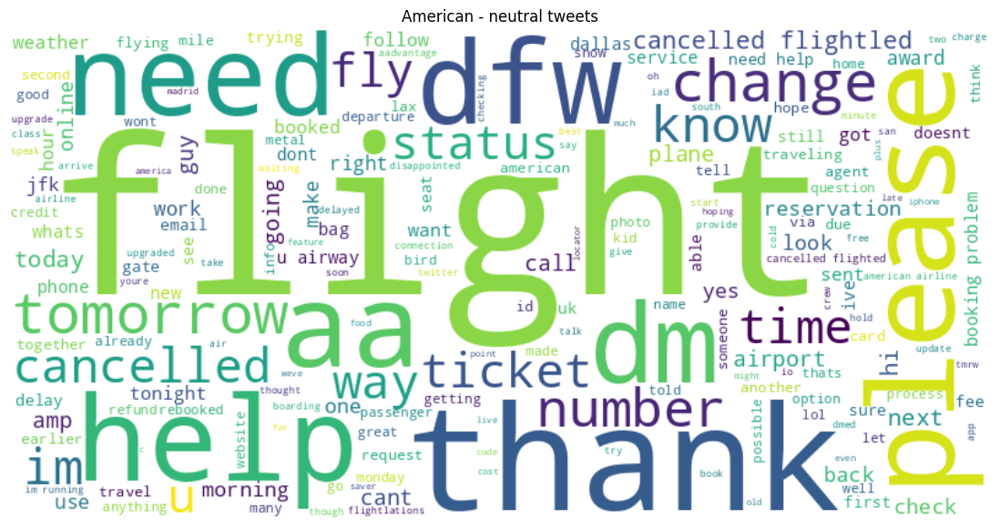

In [16]:
# 5d. Word clouds by airline and sentiment
airlines = df['airline'].unique()
for airline in airlines:
    for sentiment in ["positive","negative","neutral"]:
        text = " ".join(df[(df['airline']==airline) &
                           (df['airline_sentiment']==sentiment)]['processed_text'])
        if text.strip() != "":
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
            plt.figure(figsize=(15,7))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f"{airline} - {sentiment} tweets")
            plt.show()

In [17]:
# 6. VECTORIZE TEXT
# --------------------------------------------------------------
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(df['processed_text'])
y = df['airline_sentiment']

In [18]:
# 7. TRAIN MODEL WITH HYPERPARAMETER TUNING
# --------------------------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_grid = {
    'C': [0.01, 0.1, 1, 10],
    'max_iter': [100, 200, 500],
    'solver': ['lbfgs']
}

grid = GridSearchCV(LogisticRegression(), param_grid, cv=5, scoring='f1_macro', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best parameters:", grid.best_params_)
print("Best F1 score (CV):", grid.best_score_)

best_model = grid.best_estimator_

Best parameters: {'C': 1, 'max_iter': 100, 'solver': 'lbfgs'}
Best F1 score (CV): 0.6879827807197135


              precision    recall  f1-score   support

    negative       0.82      0.94      0.88      1889
     neutral       0.68      0.48      0.56       580
    positive       0.82      0.61      0.70       459

    accuracy                           0.80      2928
   macro avg       0.77      0.68      0.71      2928
weighted avg       0.79      0.80      0.79      2928



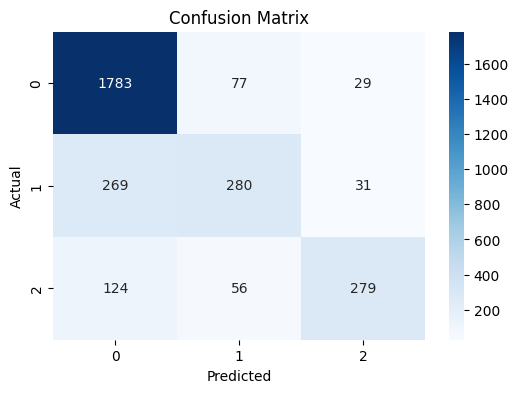

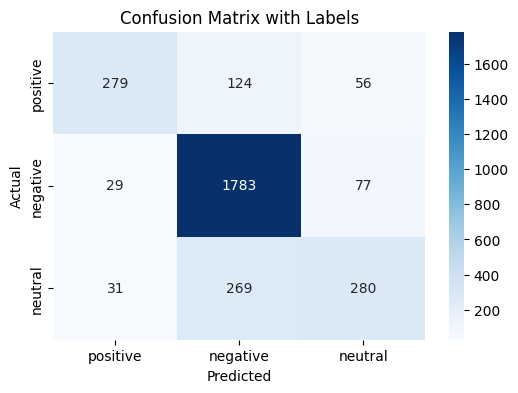

In [19]:
# 8. EVALUATE MODEL
# --------------------------------------------------------------
y_pred = best_model.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

# Confusion matrix (simple)
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Confusion matrix with labels
labels = ["positive","negative","neutral"]
cm = confusion_matrix(y_test, y_pred, labels=labels)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels,
            yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()